# Exploratory Analysis of the Data

> Done by Marta Galván

In [1]:
import pandas as pd
import pandas as pd
import numpy as np
import statistics as stats
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import scipy.stats as ss
import statistics as stats
import seaborn as sns 
from pandas.plotting import autocorrelation_plot

## Visualization of the data

We upload the csv first of all, eliminating the columns **'Unnamed: 0'** and **estatus_glucemico**, since they are the ones used for defying the feature variable. Later we print the total shape of the the csv and the names of the final columns present in the data.

In [2]:
data = pd.read_csv("pacientes_progresores_2021.csv")
patient_data= data.drop(['Unnamed: 0','estatus_glucemico_inicio','estatus_glucemico_final'], axis=1) 
print(patient_data.shape)

(2016, 24)


In [3]:
patient_data.columns
columns = list(patient_data.columns)
#columns


In [4]:
patient_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2016 entries, 0 to 2015
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   sexo              2016 non-null   object 
 1   edad              2016 non-null   int64  
 2   peso              2016 non-null   float64
 3   talla             2016 non-null   int64  
 4   IMC               2016 non-null   float64
 5   TAS               2016 non-null   int64  
 6   TAD               2016 non-null   int64  
 7   LDL               1983 non-null   float64
 8   HDL               1993 non-null   float64
 9   trigl             2012 non-null   float64
 10  Hbglic            1725 non-null   float64
 11  albuminuria       1925 non-null   float64
 12  creat             2016 non-null   float64
 13  cist              2016 non-null   float64
 14  PCR               2016 non-null   float64
 15  Epi.creat         2016 non-null   float64
 16  Epi.cist          2016 non-null   float64


In [5]:
patient_data

,sexo,edad,peso,talla,IMC,TAS,TAD,LDL,HDL,trigl,...,PCR,Epi.creat,Epi.cist,diabetes,evento.cv,mortalidad,num_farmacos,hemoglobina_glic,glucemia,progresores
0,V,64,101.0,168,35.7,136,79,161.0,81.0,202.0,...,3.45,77.912391,104.784197,NO,0,0,3,5.3,96.0,progresor_prediab
1,V,50,94.0,167,33.7,138,86,134.0,57.0,161.0,...,13.10,63.621400,56.543903,NO,0,0,2,NaN,92.0,sano_no_progresor
2,M,59,96.0,157,38.9,147,68,81.0,97.0,109.0,...,3.44,94.835852,99.735909,NO,0,0,2,5.9,100.0,mejoria
3,M,47,75.0,150,33.3,141,84,199.0,78.0,612.0,...,5.50,119.731190,126.125489,NO,0,0,4,6.0,104.0,prediab_no_progresor
4,V,62,87.0,176,28.0,123,81,152.0,41.0,301.0,...,10.70,60.331459,98.543859,SI,0,0,1,6.5,156.0,diabetico
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2011,V,58,80.0,165,29.3,155,78,160.0,56.0,158.0,...,4.04,98.468928,112.675956,SI,0,0,4,8.6,204.0,diabetico
2012,M,70,75.0,155,31.2,145,72,100.0,48.0,170.0,...,6.60,93.386421,100.803927,SI,0,0,2,6.2,102.0,progresor_diab
2013,M,67,61.0,154,25.7,160,81,143.0,67.0,114.0,...,11.60,97.651100,110.267435,NO,0,0,3,5.5,91.0,sano_no_progresor
2014,V,53,114.0,169,39.9,138,88,138.0,72.0,249.0,...,5.81,84.171448,139.918535,NO,0,0,2,6.0,111.0,mejoria


In [6]:
count = patient_data['mortalidad'].value_counts()
count

0    1918
1      98
Name: mortalidad, dtype: int64

## Treatment of cathegorical values.

In the case of 'diabetes' and 'sexo' we have categorical values that need to be transformed into numbers in order to properly train the model.

In [7]:
patient_data['sexo'] = patient_data['sexo'].astype('category').cat.codes # 0 --> Mujer, 1--> Varón
patient_data['diabetes'] = patient_data['diabetes'].astype('category').cat.codes # 0 --> NO, 1--> SI

## Maximum and minimum identification

In order to see theminimum and the maximum of each variable, we use the .describe() command. 

In [8]:
patient_data.describe(include='all').T


,count,unique,top,freq,mean,std,min,25%,50%,75%,max
sexo,2016,NaN,NaN,NaN,0.493056,0.500076,0,0,0,1,1
edad,2016,NaN,NaN,NaN,56.0223,13.9768,14,48,57,65,90
peso,2016,NaN,NaN,NaN,83.0075,16.8202,45,71,81,92,166
talla,2016,NaN,NaN,NaN,162.736,10.1879,136,155,162,170,195
IMC,2016,NaN,NaN,NaN,31.2646,5.5864,16.8,27.5,30.4,34,59.2
TAS,2016,NaN,NaN,NaN,141.325,13.8755,104,132,141,149,246
TAD,2016,NaN,NaN,NaN,79.7822,9.03853,53,74,80,85,124
LDL,1983,NaN,NaN,NaN,132.923,32.6768,42,111,132,153,276
HDL,1993,NaN,NaN,NaN,63.575,17.4339,6,51,61,73,168
trigl,2012,NaN,NaN,NaN,178.102,120.43,26,108.75,147.5,208,1600


In [9]:
patient_data.describe()['edad'][['min','max']]


min    14.0
max    90.0
Name: edad, dtype: float64

A list with maximum and minimum values was created, using the columns with the numeric values (the non-numeric values were deleted). Every variable's maximum, minimum and data is associated to an element in the list. 

In [10]:
max_min_list=[]
for el in columns:
    try:
        max_min_list.append(patient_data.describe()[el][['min','max']])
    except:
        print('Para evitar el problema con progresores')

Para evitar el problema con progresores


In [11]:
max_min_list[1]


min    14.0
max    90.0
Name: edad, dtype: float64

## Outliers identification using boxplots. 

An outlier is an observation that lies an abnormal distance from other values in a random sample from a population. Boxplot will be used in order to identify them. 

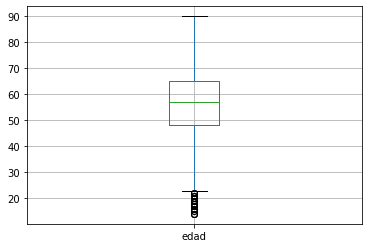

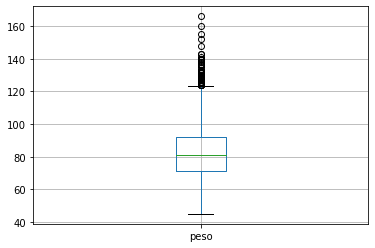

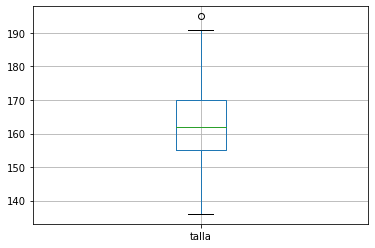

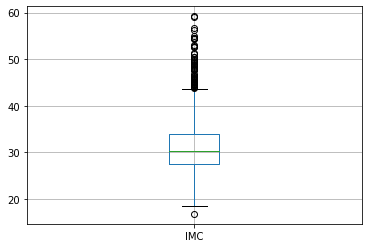

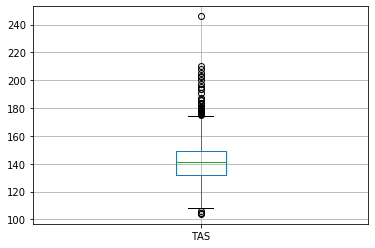

...

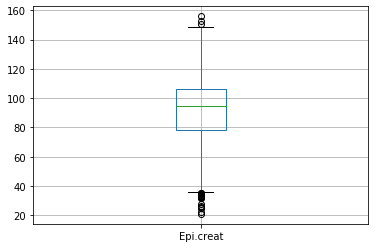

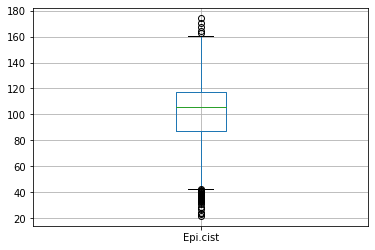

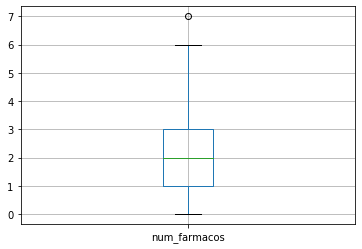

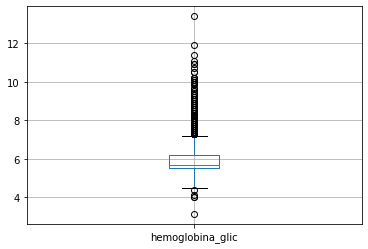

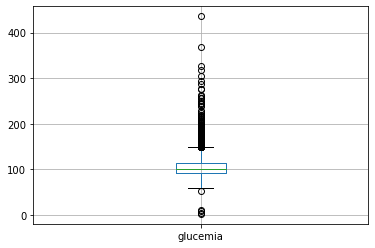

In [12]:

for i in columns:
    if i == 'mortalidad' or i=='evento.cv' or i=='sexo' or i=='diabetes' or i=='progresores': #eliminamos los dos boxplots de las variabes binarias
        continue
    else:
        patient_data.boxplot(column=i)
        plt.show()
    

The binary variables are: 'evento.cv' and 'mortalidad'. This values only give 0 or 1.

* The maximum and minimum for **age** given by the data are **[90,14]**. According to the boxplot, the maximum would be the same, but the minimum should be around 22. Any number below is an outliner. 

* The maximum and minimum for **weight** given by the data are **[166,45]**. According to the boxplot, the maximum would be 121, and the minimum should be around 45,as well. Any number outside the values is an outliner. 

* The maximum and minimum for **size** given by the data are **[195,136]**. According to the boxplot, the maximum would be 191, and the minimum should be around 136,as well. Any number outside the values is an outliner.

* The maximum and minimum for **IMC** given by the data are **[59.2,16.8]**. According to the boxplot, the maximum would be 43, and the minimum should be around 16.8,as well. Any number outside the values is an outliner.

* The maximum and minimum for **TAS** given by the data are **[246,104]**. According to the boxplot, the maximum would be around 175, and the minimum should be around 110. Any number outside the values is an outliner.

* The maximum and minimum for **TAD** given by the data are **[124,53]**. According to the boxplot, the maximum would be around 102, and the minimum should be around 58. Any number outside the values is an outliner.

* The maximum and minimum for **LDL** given by the data are **[276,42]**. According to the boxplot, the maximum would be around 220, and the minimum should be around 50. Any number outside the values is an outliner.

* The maximum and minimum for **HDL** given by the data are **[168,6]**. According to the boxplot, the maximum would be around 107, and the minimum should be around 20. Any number outside the values is an outliner.

* The maximum and minimum for **triglicerides** given by the data are **[1600,26]**. According to the boxplot, the maximum would be around 380, and the minimum should be around 26. Any number outside the values is an outliner.

* The maximum and minimum for **Hbglic** given by the data are **[13.4,4]**. According to the boxplot, the maximum would be around 7.8, and the minimum should be around 4.5. Any number outside the values is an outliner.

* The maximum and minimum for **albuminuria** given by the data are **[3037,0]**. According to the boxplot, the maximum would be around 110, and the minimum should be around 0. Any number outside the values is an outliner.

* The maximum and minimum for **creat** given by the data are **[2.3,0.3]**. According to the boxplot, the maximum would be around 0.4, and the minimum should be around 1.23. Any number outside the values is an outliner.

* The maximum and minimum for **cist** given by the data are **[2.4,0.3]**. According to the boxplot, the maximum would be around 0.6, and the minimum should be around 1.25. Any number outside the values is an outliner.

* The maximum and minimum for **PCR** given by the data are **[344,0.8]**. According to the boxplot, the maximum would be around 25, and the minimum should be around 0.8. Any number outside the values is an outliner.

* The maximum and minimum for **EPI.creat** given by the data are **[155.99,20.93]**. According to the boxplot, the maximum would be around 150, and the minimum should be around 38. Any number outside the values is an outliner.

* The maximum and minimum for **EPI.cist** given by the data are **[174.18,21.65]**. According to the boxplot, the maximum would be around 160, and the minimum should be around 41. Any number outside the values is an outliner.

* The maximum and minimum for **EPI.cist** given by the data are **[174.18,21.65]**. According to the boxplot, the maximum would be around 160, and the minimum should be around 41. Any number outside the values is an outliner.

* In the case of **evento.cv**, **mortalidad**, **diabetes** and **sexo** the boxplots are not useful, since the value can be either 1 or 0.

* The maximum and minimum for **num_farmacos** given by the data are **[7,0]**. According to the boxplot, the maximum would be around 6, and the minimum should be around 0. Any number outside the values is an outliner.

* The maximum and minimum for **hemoglobina_glic** given by the data are **[13.4,3.13]**. According to the boxplot, the maximum would be around 7.2, and the minimum should be around 5. Any number outside the values is an outliner.

* The maximum and minimum for **glucemia** given by the data are **[436,2]**. According to the boxplot, the maximum would be around 150, and the minimum should be around 50. Any number outside the values is an outliner.

## Comparison of Hbglic and hemoglobina_glic

It was noticed that both variables seemed to be the same. I will represent both in order to see the distribution of the different values through the csv and check if this asumption is true.

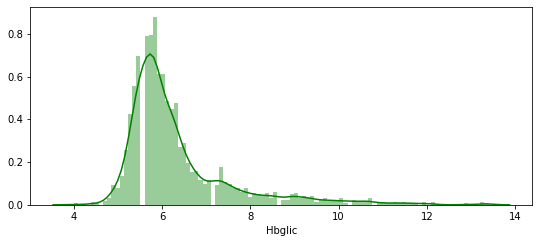

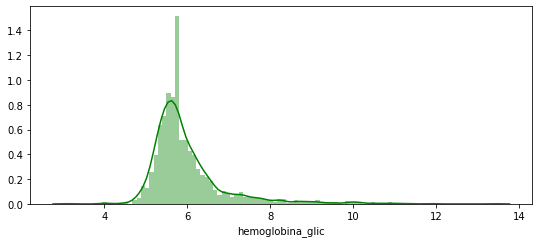

In [13]:
#print(patient_data['Hbglic'].describe())

plt.figure(figsize=(9, 8))
plt.subplot(2, 1, 1)
sns.distplot(patient_data['Hbglic'], color='g', bins=100, hist_kws={'alpha': 0.4});

#print(patient_data['hemoglobina_glic'].describe())

plt.figure(figsize=(9, 8))
plt.subplot(2, 1, 2)
sns.distplot(patient_data['hemoglobina_glic'], color='g', bins=100, hist_kws={'alpha': 0.4});

Distribution already appears to be different for each value. Let's check the values for each patient.

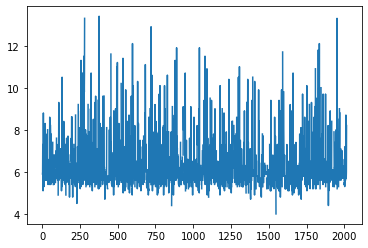

In [14]:
plt.plot(patient_data['Hbglic'])

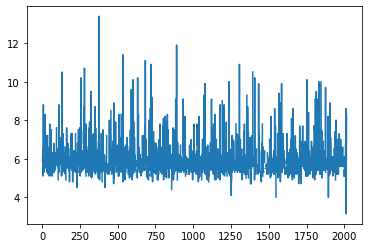

In [15]:
plt.plot(patient_data['hemoglobina_glic'])

It appears to be different in each patient. is was corroborated after a talk with the doctor. They are both considered the same. It can later stated that both affect the target variable, so they were both deleted.

In [16]:
del patient_data['Hbglic']
del patient_data['hemoglobina_glic']


## Variables to remove

As mentioned before, variables that affect directly the outcome need to be removed. Here 'diabetes' and 'glucemia' are dropped. This are the last features that need to be removed.

In [17]:
#remove diabetes
patient_data = patient_data.drop(['diabetes','glucemia'],axis = 1)

## Histogram for number of drugs.

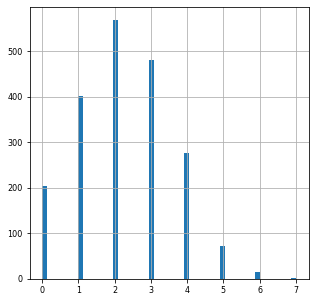

In [18]:
patient_data['num_farmacos'].hist(figsize=(5, 5), bins=50, xlabelsize=8, ylabelsize=8)

## Changing the outliers into NaN

In order to change the outlier values into **NaN** we need to apply the knowledge of the clinician that defines the values for each variable. The values obtained as. reference are obtained from a document sent by the physician. 

In [19]:
#AGE
for i in patient_data['edad']:
    if i < 20  or  i > 90:
        patient_data['edad']= patient_data['edad'].replace({i: np.nan})
        
#WEIGHT
for i in patient_data['peso']:
    if i < 50  or  i > 180:
        patient_data['peso']= patient_data['peso'].replace({i: np.nan})
        
#SIZE
for i in patient_data['talla']:  #preguntar a oscar
    if i < 120  or  i > 210:
        patient_data['talla']= patient_data['talla'].replace({i: np.nan})
        
#IMC 
for i in patient_data['IMC']:
    if i < 20  or  i > 35:
        patient_data['IMC']= patient_data['IMC'].replace({i: np.nan})
        
#TAS
for i in patient_data['TAS']:
    if i < 90  or  i > 220:
        patient_data['TAS']= patient_data['TAS'].replace({i: np.nan})
        
#TAD
for i in patient_data['TAD']:
    if i < 40  or  i > 150:
        patient_data['TAD']= patient_data['TAD'].replace({i: np.nan})
        
#LDL
for i in patient_data['LDL']:
    if i < 10  or  i > 200:
        patient_data['LDL']= patient_data['LDL'].replace({i: np.nan})
        
#HDL
for i in patient_data['HDL']:
    if i < 15  or  i > 100:
        patient_data['HDL']= patient_data['HDL'].replace({i: np.nan})

#trigl
for i in patient_data['trigl']:
    if i < 50  or  i > 750:
        patient_data['trigl']= patient_data['trigl'].replace({i: np.nan})
        
        
#albuminuria 
for i in patient_data['albuminuria']:
    if i < 0  or  i > 3000:
        patient_data['albuminuria']= patient_data['albuminuria'].replace({i: np.nan})

        
#creat 
for i in patient_data['creat']:
    if i < 0.3  or  i > 4:
        patient_data['creat']= patient_data['creat'].replace({i: np.nan})
        
#cist 
for i in patient_data['cist']:
    if i < 0.3  or  i > 4:
        patient_data['cist']= patient_data['cist'].replace({i: np.nan})

        
#PCR 
for i in patient_data['PCR']:
    if i < 3  or  i > 200:
        patient_data['PCR']= patient_data['PCR'].replace({i: np.nan})

#Epi.creat 
for i in patient_data['Epi.creat']:
    if i < 15  or  i > 160:
        patient_data['Epi.creat']= patient_data['Epi.creat'].replace({i: np.nan})

#Epi.cist 
for i in patient_data['Epi.cist']:
    if i < 15  or  i > 160:
        patient_data['Epi.cist']= patient_data['Epi.cist'].replace({i: np.nan})




Now, the number of NaN for each variable and its percentage will be staged. In the case that thee are too many NaN values for a certain feature, the feauture will be deleted, since it won't be useful. 

In [20]:
for index,value in enumerate (patient_data.isnull().sum()):
  if value !=0:
    print('There are',value,'NaNs in',patient_data.columns[index],'and the total percentage is',((value/2016)*100),'%')

There are 17 NaNs in edad and the total percentage is 0.8432539682539683 %
There are 10 NaNs in peso and the total percentage is 0.496031746031746 %
There are 416 NaNs in IMC and the total percentage is 20.634920634920633 %
There are 1 NaNs in TAS and the total percentage is 0.0496031746031746 %
There are 84 NaNs in LDL and the total percentage is 4.166666666666666 %
There are 83 NaNs in HDL and the total percentage is 4.117063492063492 %
There are 25 NaNs in trigl and the total percentage is 1.2400793650793651 %
There are 92 NaNs in albuminuria and the total percentage is 4.563492063492063 %
There are 5 NaNs in PCR and the total percentage is 0.248015873015873 %
There are 6 NaNs in Epi.cist and the total percentage is 0.2976190476190476 %
There are 63 NaNs in progresores and the total percentage is 3.125 %


## Boxplots and histograms organized by the labels of 'progenitores'.

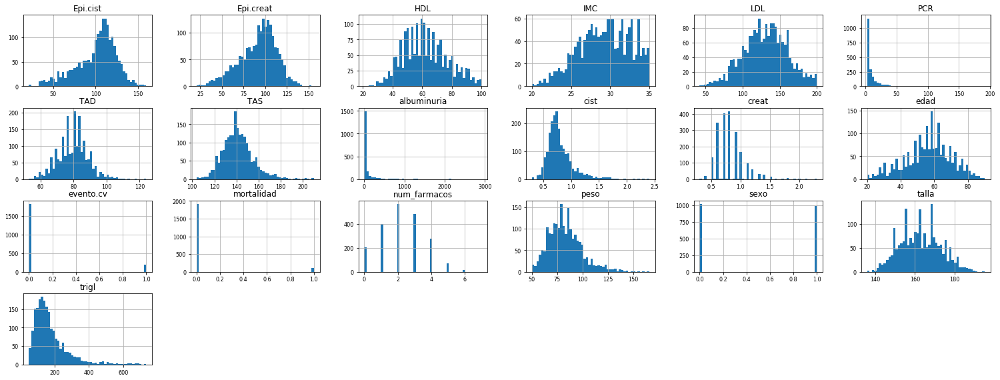

In [21]:
histograms = patient_data.hist(figsize=(26, 25), bins=50, xlabelsize=8, ylabelsize=8,layout = (10,6))

Avoid problem with cat variables
Avoid problem with cat variables
Avoid problem with cat variables
Avoid problem with cat variables
Avoid problem with cat variables


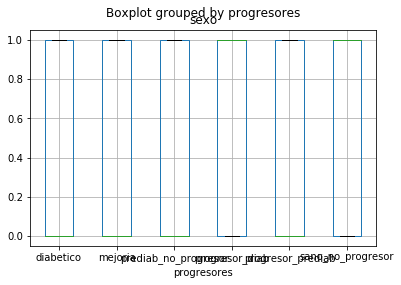

<Figure size 432x288 with 0 Axes>

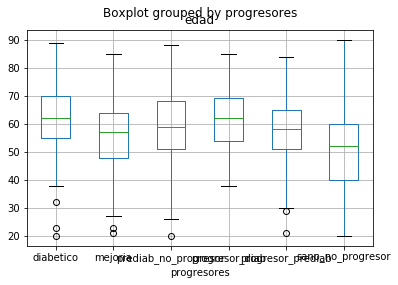

<Figure size 432x288 with 0 Axes>

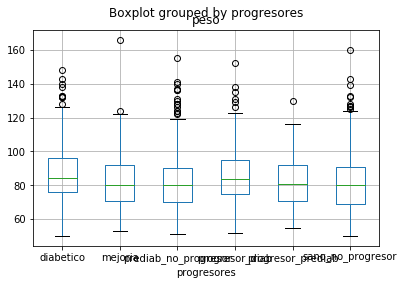

<Figure size 432x288 with 0 Axes>

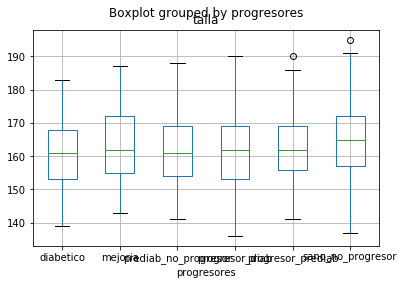

<Figure size 432x288 with 0 Axes>

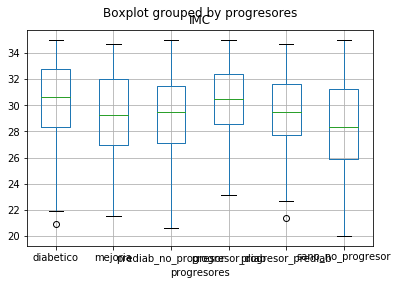

<Figure size 432x288 with 0 Axes>

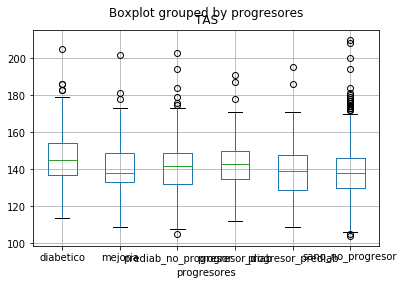

<Figure size 432x288 with 0 Axes>

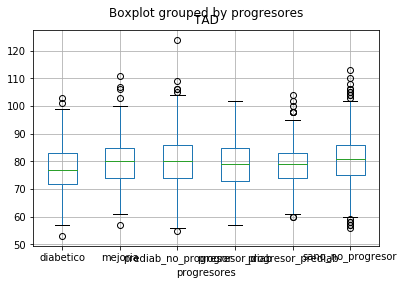

<Figure size 432x288 with 0 Axes>

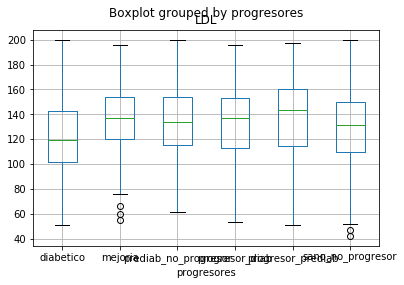

<Figure size 432x288 with 0 Axes>

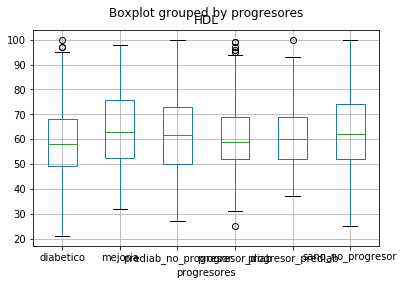

<Figure size 432x288 with 0 Axes>

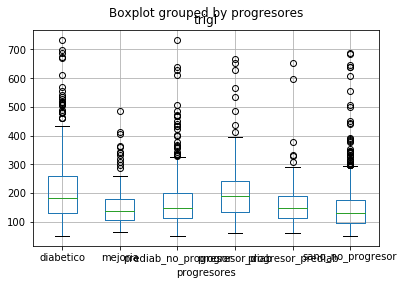

<Figure size 432x288 with 0 Axes>

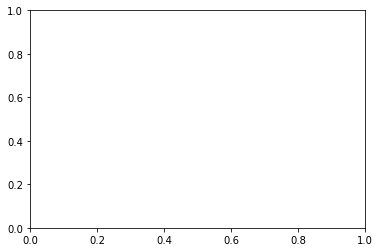

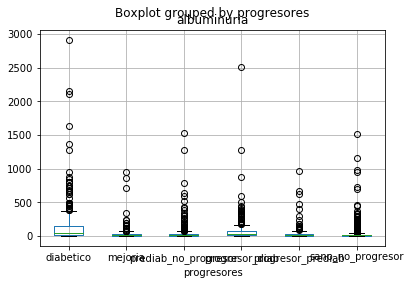

<Figure size 432x288 with 0 Axes>

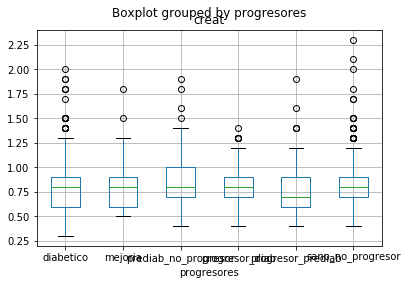

<Figure size 432x288 with 0 Axes>

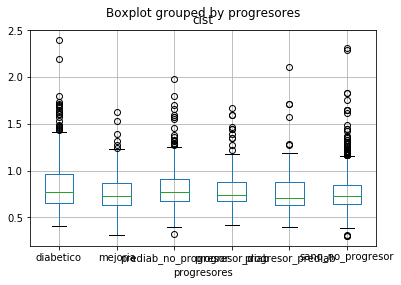

<Figure size 432x288 with 0 Axes>

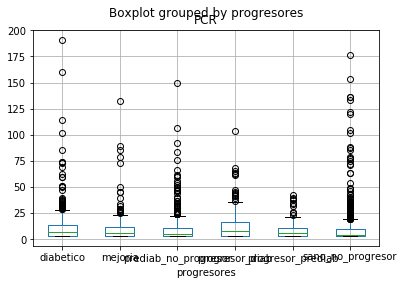

<Figure size 432x288 with 0 Axes>

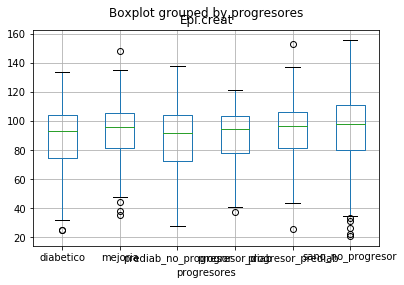

<Figure size 432x288 with 0 Axes>

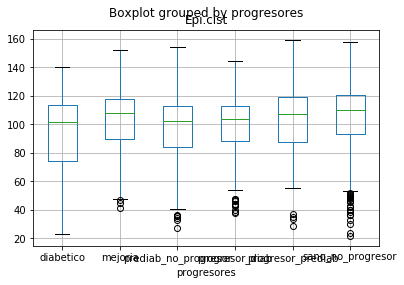

<Figure size 432x288 with 0 Axes>

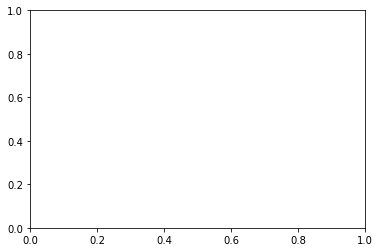

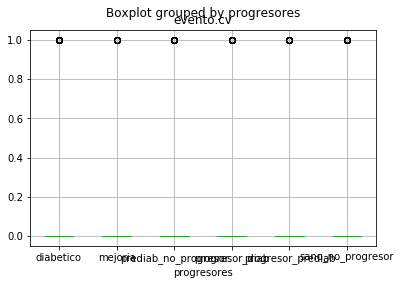

<Figure size 432x288 with 0 Axes>

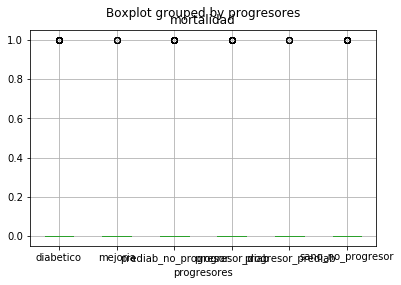

<Figure size 432x288 with 0 Axes>

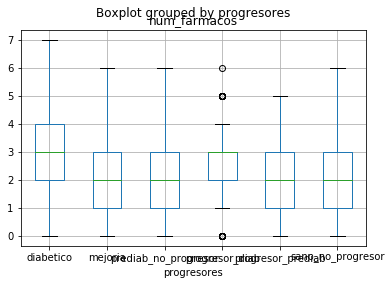

<Figure size 432x288 with 0 Axes>

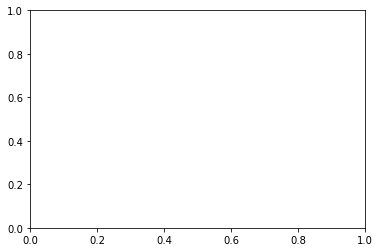

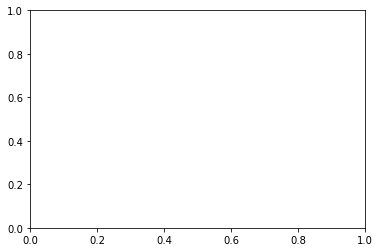

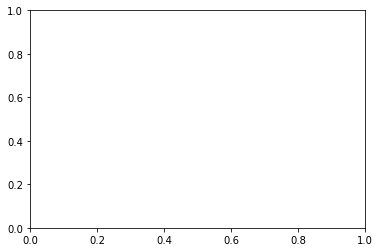

In [22]:
plt.rcParams.update({'figure.max_open_warning': 0})  
column_name=list(columns)
for i in column_name:
    try:
        patient_data.boxplot(by='progresores',column =i)
        plt.figure()
    except:
        print('Avoid problem with cat variables')

## Percentage of each class of 'progresores'

In [23]:
count = patient_data['progresores'].value_counts()
print(count)

sano_no_progresor       758
diabetico               361
prediab_no_progresor    360
progresor_diab          196
mejoria                 157
progresor_prediab       121
Name: progresores, dtype: int64


In [24]:
sum(count)

1953

There must be some empty values because we are not reaching the 2016 total number of patients. The percentages are the following:

In [25]:
for el in count:
    print('The percentages are',(el/sum(count))*100, '%')

The percentages are 38.81208397337429 %
The percentages are 18.484383000512032 %
The percentages are 18.433179723502306 %
The percentages are 10.03584229390681 %
The percentages are 8.038914490527393 %
The percentages are 6.1955965181771635 %


# Train and Test separation.

In this case, the 7 different classes are separated into 3 main ones, which are:
* **Unhealthy patients**: 
    - Patients that go from healthy to diabetic.
    - Patients that are diabetic
    - Patients that go from prediabetic to diabetic
* **Prediabetic patients**:
    - Patients that go from healthy to prediabetic
    - Patients that stay prediabetic
* **Healthy patients**: 
    - Patients that go from prediabetic to healthy
    - Patients that stay healthy

In [26]:
patient_data.progresores
print(patient_data.progresores.isnull().sum())

63


In [27]:
patient_data.progresores= patient_data.progresores.fillna('sano_progresor')

In [28]:
count = patient_data['progresores'].value_counts()
print(count)

sano_no_progresor       758
diabetico               361
prediab_no_progresor    360
progresor_diab          196
mejoria                 157
progresor_prediab       121
sano_progresor           63
Name: progresores, dtype: int64


In [29]:
for el in count:
    print('The percentages are',(el/sum(count))*100, '%')

The percentages are 37.59920634920635 %
The percentages are 17.90674603174603 %
The percentages are 17.857142857142858 %
The percentages are 9.722222222222223 %
The percentages are 7.787698412698413 %
The percentages are 6.001984126984127 %
The percentages are 3.125 %


In [30]:
patient_data.loc[patient_data.progresores=='sano_no_progresor', 'progresores'] = 'healthy'
patient_data.loc[patient_data.progresores=='mejoria', 'progresores'] = 'healthy'

patient_data.loc[patient_data.progresores=='progresor_prediab', 'progresores'] = 'prediabetic'
patient_data.loc[patient_data.progresores=='prediab_no_progresor', 'progresores'] = 'prediabetic'


patient_data.loc[patient_data.progresores=='diabetico', 'progresores'] = 'unhealthy'
patient_data.loc[patient_data.progresores=='progresor_diab', 'progresores'] = 'unhealthy'
patient_data.loc[patient_data.progresores=='sano_progresor', 'progresores'] = 'unhealthy'


In [31]:
count = patient_data['progresores'].value_counts()
print(count)

healthy        915
unhealthy      620
prediabetic    481
Name: progresores, dtype: int64


In [32]:
for el in count:
    print('The percentages are',(el/sum(count))*100, '%')

The percentages are 45.38690476190476 %
The percentages are 30.753968253968257 %
The percentages are 23.859126984126984 %


In [33]:
from sklearn.model_selection import train_test_split

X = patient_data.drop(['progresores'],axis=1)
Y = patient_data.progresores

X_train, X_test,y_train, y_test = train_test_split(X, Y, test_size=0.2,random_state=4, stratify = patient_data["progresores"])

## Imputation using the median

In [34]:
X_train = X_train.fillna(X_train.median()) 


#Check that all were properly replaced

X_train.isnull().sum()

sexo            0
edad            0
peso            0
talla           0
IMC             0
TAS             0
TAD             0
LDL             0
HDL             0
trigl           0
albuminuria     0
creat           0
cist            0
PCR             0
Epi.creat       0
Epi.cist        0
evento.cv       0
mortalidad      0
num_farmacos    0
dtype: int64

In [35]:
X_test = X_test.fillna(X_train.median()) 


#Check that all were properly replaced

X_test.isnull().sum()



sexo            0
edad            0
peso            0
talla           0
IMC             0
TAS             0
TAD             0
LDL             0
HDL             0
trigl           0
albuminuria     0
creat           0
cist            0
PCR             0
Epi.creat       0
Epi.cist        0
evento.cv       0
mortalidad      0
num_farmacos    0
dtype: int64

## Dendogram and correlation between variables.

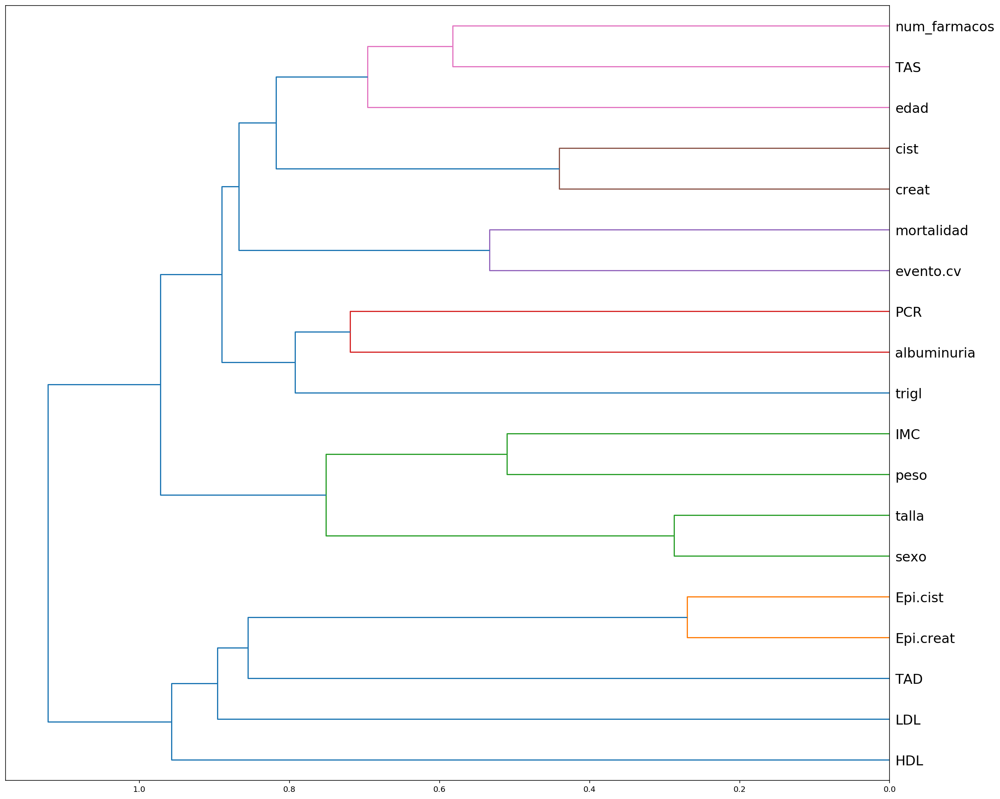

In [36]:
import scipy 
from scipy.cluster import hierarchy as hc
corr = np.round(scipy.stats.spearmanr(X_train).correlation, 4)
corr_condensed = hc.distance.squareform(1-corr)
z = hc.linkage(corr_condensed, method='average')
fig = plt.figure(figsize=(20,18))
dendrogram = hc.dendrogram(z, labels=list(X_train.columns), 
      orientation='left', leaf_font_size=17)
#plt.tight_layout()

%config InlineBackend.figure_format = 'retina'

There is no need  eliminate any variable, since none of them are too closely related. 

Text(0.5, 1.0, 'albuminuria')

<Figure size 432x288 with 0 Axes>

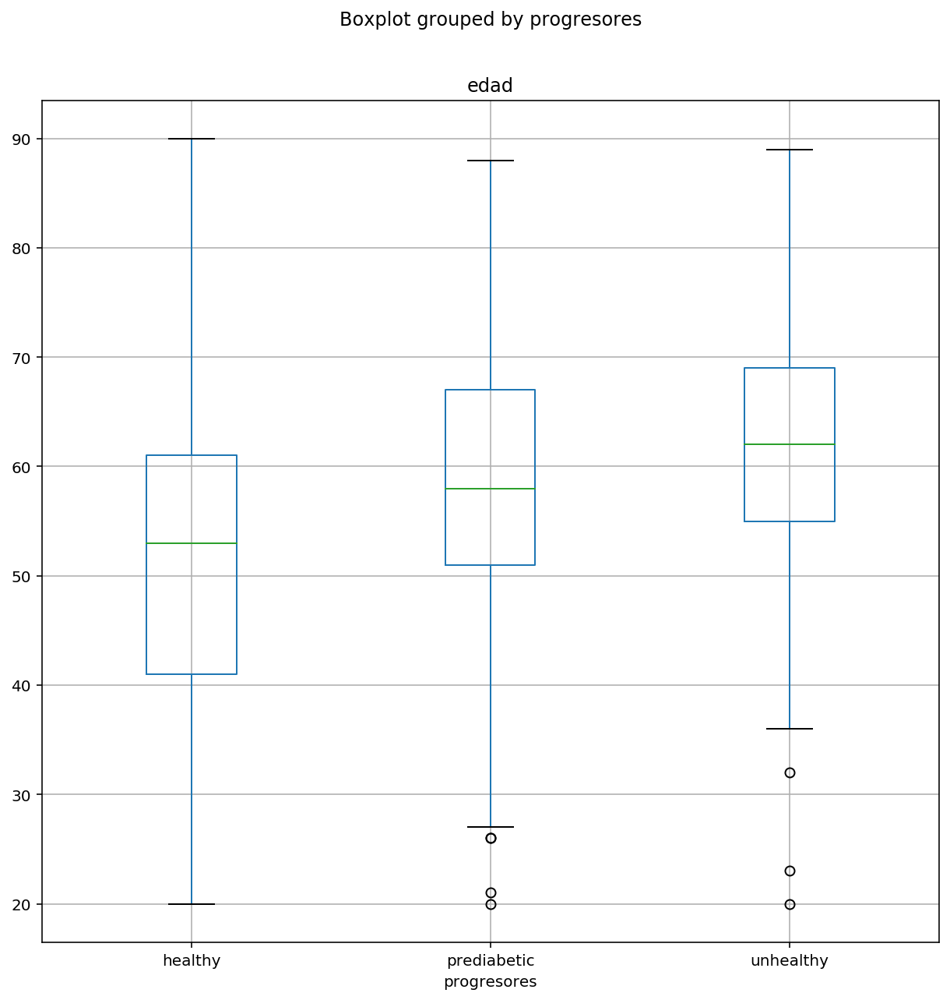

<Figure size 432x288 with 0 Axes>

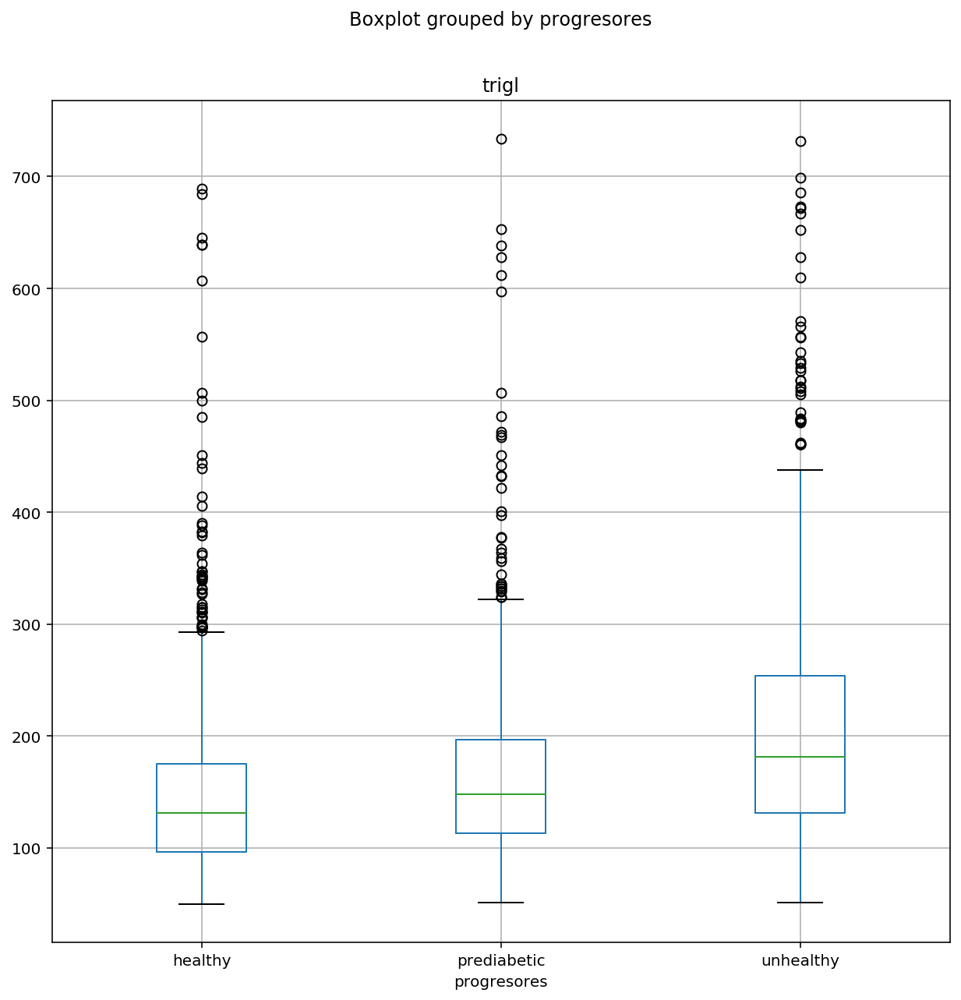

<Figure size 432x288 with 0 Axes>

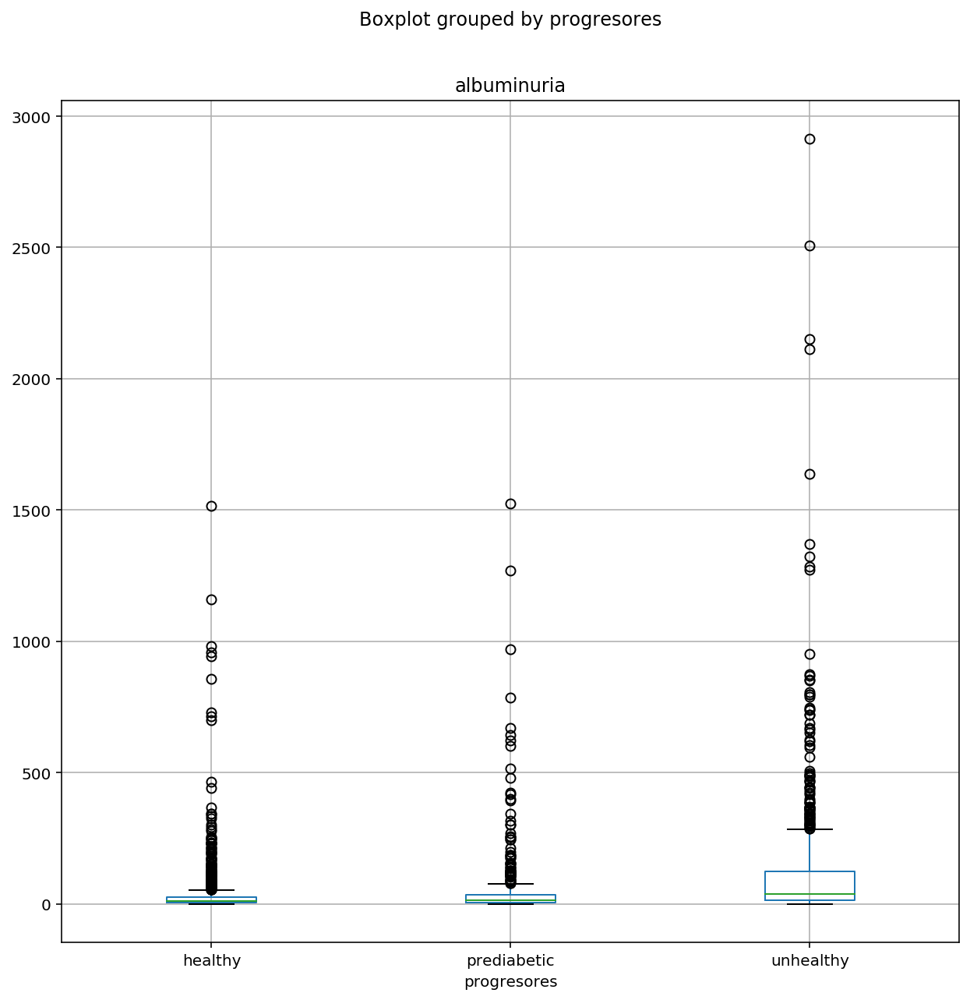

In [37]:
plt.figure()
patient_data.boxplot(by='progresores',column="edad",figsize=(10,10))
plt.title("edad")

plt.figure()
patient_data.boxplot(by='progresores',column="trigl",figsize=(10,10))
plt.title("trigl")

plt.figure()
patient_data.boxplot(by='progresores',column="albuminuria",figsize=(10,10))
plt.title("albuminuria")

# EXPERIMENTS

## EXP 1. Creation of two decision trees

Two trees will be designed: one will no depth limitation and another one with a depth limitation of 4. 

In [38]:
from sklearn.tree import DecisionTreeClassifier 
from sklearn.model_selection import train_test_split 
from sklearn import metrics 
from six import StringIO

In [39]:
from sklearn import tree

my_model_1 = tree.DecisionTreeClassifier(random_state=1)
my_model_2_limited_depth = tree.DecisionTreeClassifier(random_state=1, max_depth = 4)

my_tree=my_model_1.fit(X_train, y_train)
my_tree_2 = my_model_2_limited_depth.fit(X_train,y_train)

y_pred_1 = my_tree.predict(X_test)
y_pred_2 = my_tree_2.predict(X_test)

# Model Accuracy, how often is the classifier correct?

print("Accuracy tree 1:",metrics.accuracy_score(y_test, y_pred_1))
print("Accuracy tree 2 with limited depth:",metrics.accuracy_score(y_test, y_pred_2))


Accuracy tree 1: 0.4381188118811881
Accuracy tree 2 with limited depth: 0.5173267326732673


In [40]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(my_tree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['healthy','prediabetic','unhealthy'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

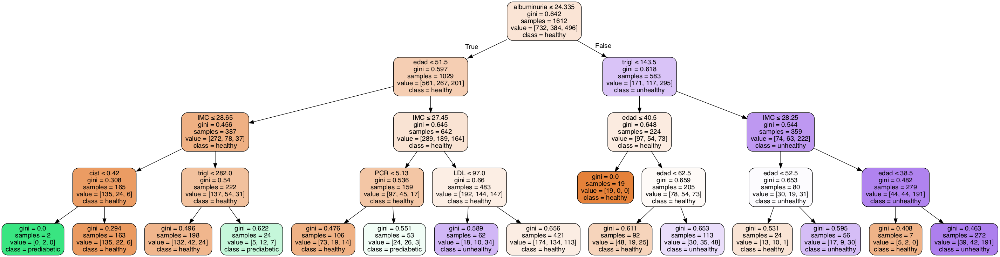

In [41]:
dot_data = StringIO()  
export_graphviz(my_tree_2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = X_train.columns,class_names=['healthy','prediabetic','unhealthy'])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
#graph.write_png('diabetes.png')
Image(graph.create_png())

### Performance evaluators original decision tree

Since calculating the accuracy might not be a good indicator on its own, the confusion matrix, cohen's kappa indicator, specificity and sensitivity are calculated. 

Text(0.5, 1.0, 'Original decision tree')

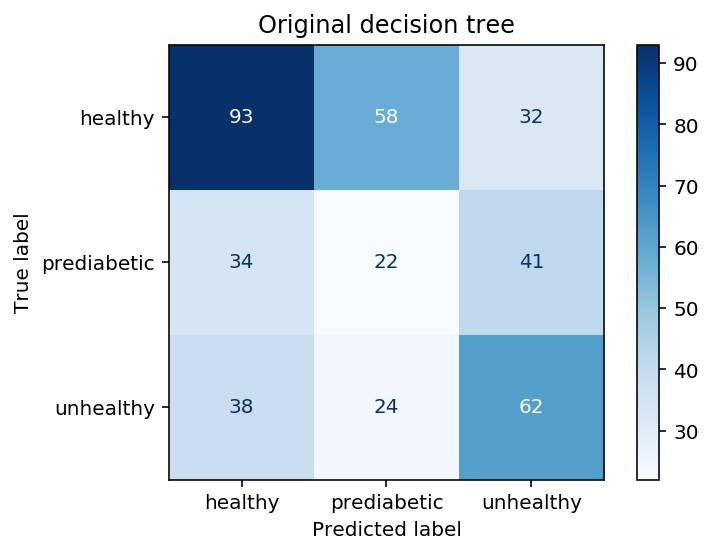

In [42]:
from sklearn.metrics import plot_confusion_matrix

plot_confusion_matrix(my_tree, X_test, y_test,display_labels=['healthy','prediabetic','unhealthy'],
                                 cmap=plt.cm.Blues)
plt.title("Original decision tree")



In [43]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(y_pred_1, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

0.13640258774118819

In [44]:
sensibilidad_tree_1 =metrics.recall_score(y_test, y_pred_1,average="macro")
specificity_tree_1= metrics.confusion_matrix(y_test, y_pred_1)[0][0]/(metrics.confusion_matrix(y_test, y_pred_1)[0][0]+metrics.confusion_matrix(y_test, y_pred_1)[0][1])

print(sensibilidad_tree_1)

print(specificity_tree_1)

0.41166694834093853
0.6158940397350994


### Performance evaluators for original tree with limited depth

Text(0.5, 1.0, 'Original decision tree with depth of 4')

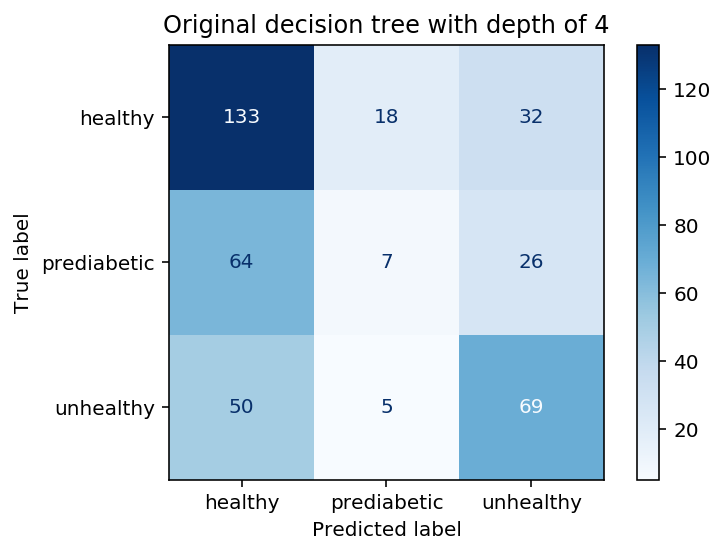

In [45]:
from sklearn.metrics import plot_confusion_matrix


plot_confusion_matrix(my_tree_2, X_test, y_test,display_labels=['healthy','prediabetic','unhealthy'],
                                 cmap=plt.cm.Blues)
plt.title("Original decision tree with depth of 4")


In [46]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(y_pred_2, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

0.20710166369757554

In [47]:
sensibilidad_tree_1 =metrics.recall_score(y_test, y_pred_2,average="macro")
specificity_tree_1= metrics.confusion_matrix(y_test, y_pred_2)[0][0]/(metrics.confusion_matrix(y_test, y_pred_2)[0][0]+metrics.confusion_matrix(y_test, y_pred_2)[0][1])


print(sensibilidad_tree_1)

print(specificity_tree_1)

0.451797505880329
0.8807947019867549


## EXP 2. Hyperparameter search in 50 trees and creation of first forest

This hiperparameter search is done in order to obtain the best parameters for our forest. 

In [48]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import  GridSearchCV

# GridSearchCV
param_grid = { 'criterion':['gini','entropy'],'max_depth': np.arange(3,15), 'min_samples_leaf':np.arange(5,30,5)}

# Create decision Tree
forest=RandomForestClassifier(n_estimators=50,
                              random_state=0,max_features="sqrt",n_jobs=-1,oob_score=True,bootstrap=True)

# Use gridsearch for evaluating parameters
forest = GridSearchCV(forest, param_grid, cv=3)


forest=forest.fit(X_train, y_train)
print(forest.best_params_)

# train model
my_model = forest.best_estimator_
my_forest=my_model.fit(X_train, y_train)




{'criterion': 'entropy', 'max_depth': 9, 'min_samples_leaf': 10}


According to the search, the creterion to be used is entropy, the maximum depth of the tree is 10 nodes, and the minimum samples per leaf is 10. 

In [49]:
crit = my_model.criterion
max_depth = my_model.max_depth
min_samples_leaf = my_model.min_samples_leaf

In [50]:
modified_forest_1=RandomForestClassifier(n_estimators=1000,
                              random_state=0,max_features="sqrt",n_jobs=-1,oob_score=True,bootstrap=True, criterion= crit,max_depth=max_depth,min_samples_leaf=min_samples_leaf)

modified_forest_1.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, max_features='sqrt',
                       min_samples_leaf=10, n_estimators=1000, n_jobs=-1,
                       oob_score=True, random_state=0)

### Performance evaluators for first random forest

In [51]:
y_pred_forest_1 = modified_forest_1.predict(X_test)

# Model Accuracy, how often is the classifier correct?

print("Accuracy forest 1:",metrics.accuracy_score(y_test, y_pred_forest_1))
print("OOB score forest 1:",modified_forest_1.oob_score_)

Accuracy forest 1: 0.5841584158415841
OOB score forest 1: 0.5700992555831266


In [52]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(y_pred_forest_1, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

0.30621799261977534

In [53]:
sensibilidad_tree_1 =metrics.recall_score(y_test, y_pred_forest_1,average="macro")
specificity_tree_1= metrics.confusion_matrix(y_test, y_pred_forest_1)[0][0]/(metrics.confusion_matrix(y_test, y_pred_forest_1)[0][0]+metrics.confusion_matrix(y_test, y_pred_forest_1)[0][1])


print(sensibilidad_tree_1)

print(specificity_tree_1)

0.5018068041600564
0.9807692307692307


Text(0.5, 1.0, 'Random forest with hyperparameter search values')

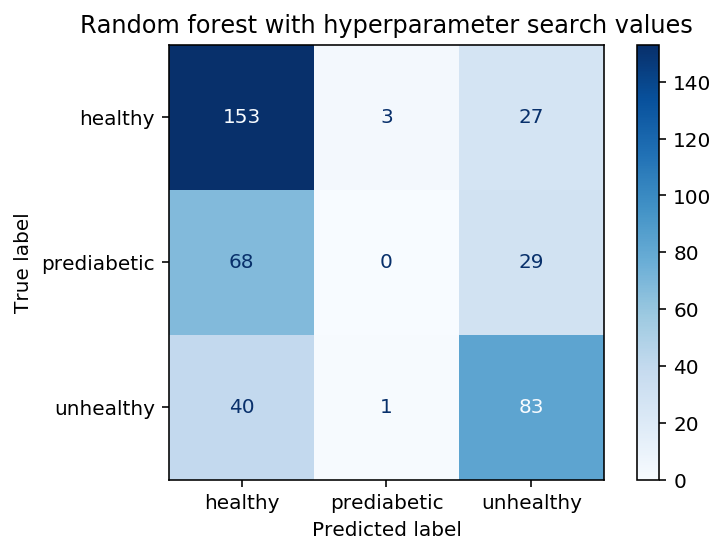

In [54]:
from sklearn.metrics import plot_confusion_matrix

#árbol profundidad completo
plot_confusion_matrix(modified_forest_1, X_test, y_test,display_labels=['healthy','prediabetic','unhealthy'],
                                 cmap=plt.cm.Blues)
plt.title("Random forest with hyperparameter search values")
#%config InlineBackend.figure_format = 'svg'


## EXP 3. Permutation importance and Feature Selection.

### Permutation importance

Permutation importance was done with different libraries in order to see differences between them.


In [56]:
import eli5  
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(modified_forest_1, random_state=1).fit(X_train, y_train)
eli5.show_weights(perm, feature_names = X_train.columns.tolist())

Weight,Feature
0.0995 ± 0.0186,albuminuria
0.0789 ± 0.0112,trigl
0.0692 ± 0.0092,edad
0.0372 ± 0.0061,IMC
0.0275 ± 0.0050,peso
0.0246 ± 0.0073,Epi.cist
0.0234 ± 0.0047,talla
0.0233 ± 0.0099,LDL
0.0223 ± 0.0038,TAS
0.0215 ± 0.0023,TAD


In [57]:
import eli5
from eli5.sklearn import PermutationImportance
from sklearn.svm import SVC
from sklearn.feature_selection import SelectFromModel
# perm.feature_importances_ attribute is now available, it can be used
# for feature selection - let's e.g. select features which increase
# accuracy by at least 0.05:
sel = SelectFromModel(perm, threshold=0.05, prefit=True)
X_train2 = sel.transform(X_train)
X_test2 = sel.transform(X_test)

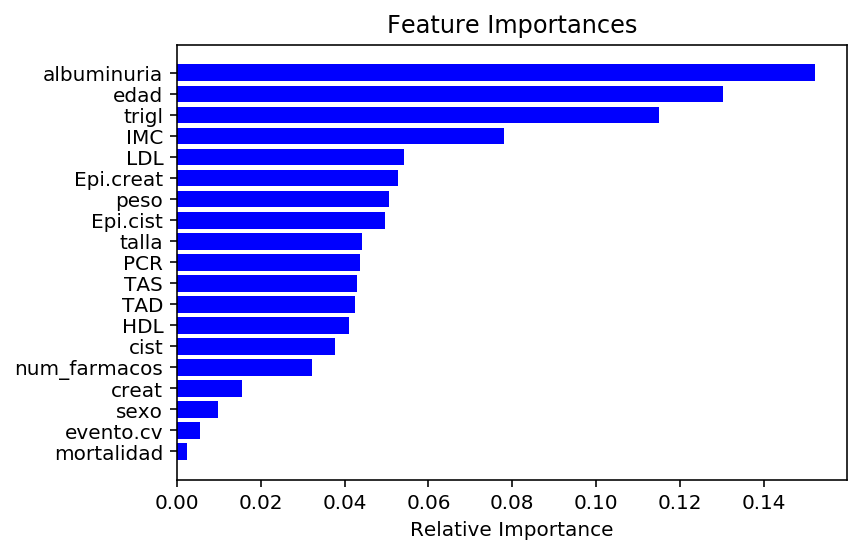

In [58]:
importances = modified_forest_1.feature_importances_
indices = np.argsort(importances)
features = patient_data.columns
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color = 'b', align = 'center')
plt.yticks(range(len(indices)),[features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

> Used part

1.0


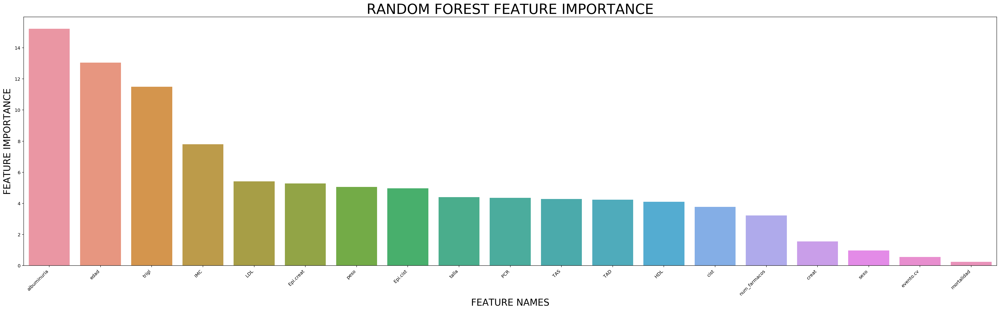

In [59]:
import seaborn as sns
#Plot feature importance
def plot_feature_importance(importance,names,model_type):

  #Create arrays from feature importance and feature names
  feature_importance = np.array(importance)
  feature_names = np.array(names)

  #Create a DataFrame using a Dictionary
  data={'feature_names':feature_names,'feature_importance':feature_importance}
  fi_df = pd.DataFrame(data)

  #Sort the DataFrame in order decreasing feature importance
  fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

  #Define size of bar plot
  fig = plt.figure(figsize=(30,10))
  #Plot Searborn bar chart
  sns.barplot(y=fi_df['feature_importance'], x=fi_df['feature_names'])
  #Add chart labels
  plt.title(model_type + 'FEATURE IMPORTANCE',fontsize=30)
  plt.xlabel('FEATURE NAMES',fontsize=20)
  plt.ylabel('FEATURE IMPORTANCE',fontsize=20)
  plt.tight_layout()
  fig.autofmt_xdate(rotation=45)


plot_feature_importance(modified_forest_1.feature_importances_*100,X_train.columns,'RANDOM FOREST ')
#plt.rc('xtick',labelsize=20)
#plt.rc('ytick',labelsize=20)

print(np.sum(modified_forest_1.feature_importances_))

The graph shows **albuminuria**,**edad** and **trigl** to be the ones that affect most the model, among the 19 different features that are present in the final DB.

### Feature selection

Feature selection is done based on the permutation importance of each of the different features. 

In [60]:

from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import cross_val_score

scores_cv = []
thresholds = np.sort(modified_forest_1.feature_importances_) # obtiene la importancia de cada característica
i = 0
for thresh in thresholds:
    print("{} de {}".format(i,len(thresholds)))
    selection = SelectFromModel(modified_forest_1, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_train)
    # train model
    selection_model = RandomForestClassifier(n_estimators=500, n_jobs=-1,criterion= crit,max_depth=max_depth,min_samples_leaf=min_samples_leaf,random_state=0,max_features="sqrt",oob_score=True,bootstrap=True)
    #cv estimation
    sc =cross_val_score(selection_model, select_X_train, y_train, cv=10, scoring='accuracy',n_jobs=-1)
    scores_cv.append(sc)
    i+=1

0 de 19
1 de 19
2 de 19
3 de 19
4 de 19
5 de 19
6 de 19
7 de 19
8 de 19
9 de 19
10 de 19
11 de 19
12 de 19
13 de 19
14 de 19
15 de 19
16 de 19
17 de 19
18 de 19


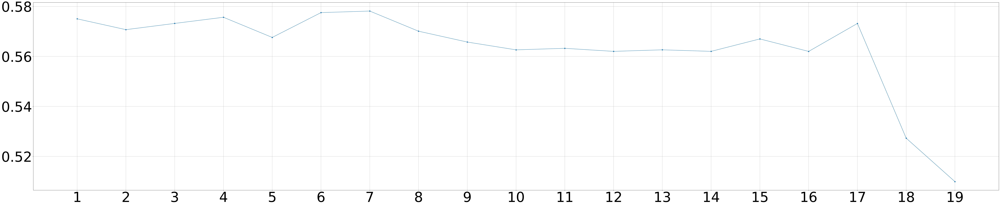

In [67]:
plt.rc('xtick',labelsize=80)
plt.rc('ytick',labelsize=80)
plt.figure(figsize = (100,20))
sc_cv = np.asarray(scores_cv)
scores_m = np.mean(sc_cv,axis = 1)
scores_std = np.std(sc_cv,axis = 1)
xx = np.arange(len(scores_m))
plt.plot(xx,scores_m,'o-')
plt.grid()
_ = plt.xticks(xx,labels= np.arange(1,len(scores_m)+1))
plt.xlabel('Number of features removed',fontsize=100)
plt.ylabel('Accuracy',fontsize=100)



In [62]:
def rf_feat_importance(m, df):
    return pd.DataFrame({'cols':df.columns, 'imp':m.feature_importances_}
                       ).sort_values('imp', ascending=False)


#convert into a dataframe with sorted feature importances
fi = rf_feat_importance(modified_forest_1,X_train)

#select the features
selected_features_RF = fi[:len(fi)-7]['cols'].to_list()
print("Numero de variables seleccionadas Pars:",len(selected_features_RF))
print("Selected features:",selected_features_RF)


X_train_FT = X_train[selected_features_RF]
X_test_FT = X_test[selected_features_RF]



Numero de variables seleccionadas Pars: 12
Selected features: ['albuminuria', 'edad', 'trigl', 'IMC', 'LDL', 'Epi.creat', 'peso', 'Epi.cist', 'talla', 'PCR', 'TAS', 'TAD']


After doing several tests, the model obtained its best outcome when using **12 features**, being this the number were the model was more stable.  Therefore the number of features removed was 7, before the accuracy started to decrease. This was the point of best accuracy.  

## EXP 4. Final forest and Clinical Interpretation

In [63]:
forest_final=RandomForestClassifier(n_estimators=5000,
                              random_state=0,max_features="sqrt",n_jobs=-1,oob_score=True,bootstrap=True, criterion= crit,max_depth=max_depth,min_samples_leaf=min_samples_leaf)
forest_final.fit(X_train_FT, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9, max_features='sqrt',
                       min_samples_leaf=10, n_estimators=5000, n_jobs=-1,
                       oob_score=True, random_state=0)

### Performance evaluators for final random forest

In [64]:
y_pred_forest_2 = forest_final.predict(X_test_FT)

# Model Accuracy, how often is the classifier correct?

print("Accuracy tree 1:",metrics.accuracy_score(y_test, y_pred_forest_2))
print("OOB score forest 1:",forest_final.oob_score_)


Accuracy tree 1: 0.5816831683168316
OOB score forest 1: 0.5781637717121588


Text(0.5, 1.0, 'Final Decision Tree Matrix')

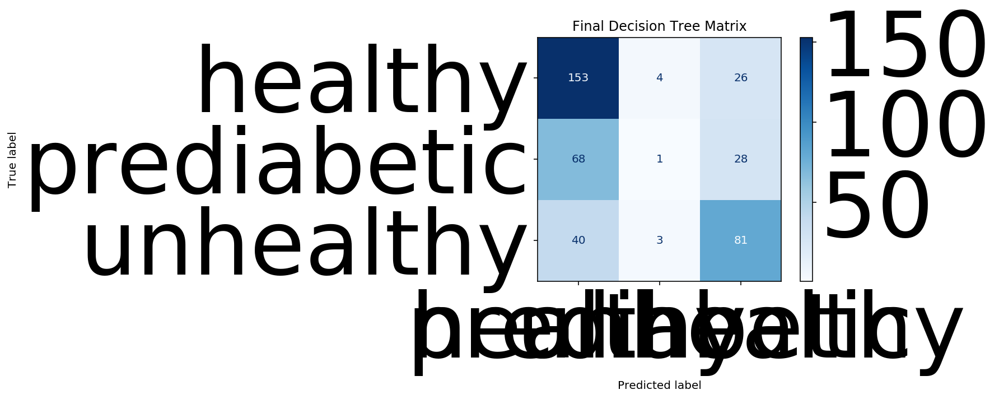

In [68]:
plot_confusion_matrix(forest_final, X_test_FT, y_test,display_labels=['healthy','prediabetic','unhealthy'],
                                 cmap=plt.cm.Blues)
plt.title("Final Decision Tree Matrix")

(array([0, 1, 2]), <a list of 3 Text xticklabel objects>)

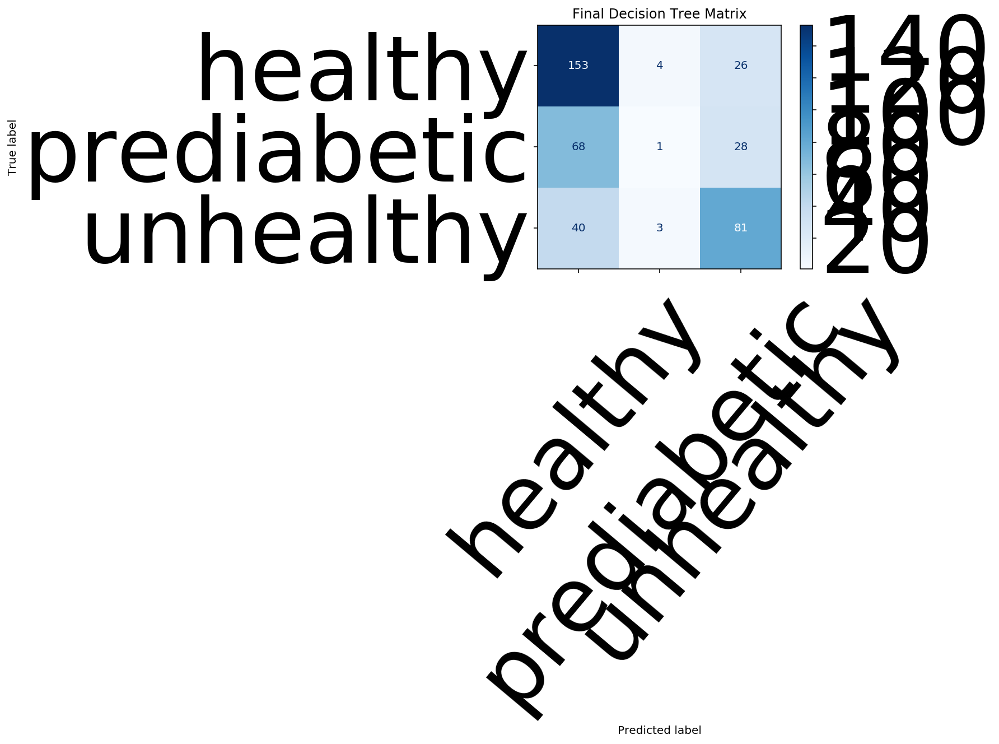

In [66]:
from sklearn.metrics import plot_confusion_matrix


plot_confusion_matrix(forest_final, X_test_FT, y_test,display_labels=['healthy','prediabetic','unhealthy'],
                                 cmap=plt.cm.Blues)
plt.title("Final Decision Tree Matrix")
plt.rc('xtick',labelsize=1)
plt.rc('ytick',labelsize=1)

plt.xticks(rotation=50)

In [ ]:
from sklearn.metrics import cohen_kappa_score
cohen_kappa_score(y_pred_forest_2, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

In [ ]:
sensibilidad_tree_1 =metrics.recall_score(y_test, y_pred_forest_2,average="macro")
specificity_tree_1= metrics.confusion_matrix(y_test, y_pred_forest_2)[0][0]/(metrics.confusion_matrix(y_test, y_pred_forest_2)[0][0]+metrics.confusion_matrix(y_test, y_pred_forest_2)[0][1])


print(sensibilidad_tree_1)

print(specificity_tree_1)

### Permutation importance of final model using eli5

In [ ]:
import eli5  
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(forest_final, random_state=1).fit(X_train_FT, y_train)
eli5.show_weights(perm, feature_names = X_train_FT.columns.tolist())

### Partial dependence plots

They show how a feature affect predictions. I decided to plot only the partial dependence plots of the three first feautures, since they appear to be the ones that affect most the model.


In [ ]:
from matplotlib import pyplot as plt
from pdpbox import pdp, get_dataset, info_plots

for i in X_train_FT.columns[:3]:#X_train_FT.columns[:3]:
    pdp_goals = pdp.pdp_isolate(model=forest_final, dataset=X_train_FT, model_features=X_train_FT.columns, feature=i, num_grid_points = 20)

    plt.figure()
      
    fig,ax = pdp.pdp_plot(pdp_goals, i, plot_lines=True, cluster = False, n_cluster_centers= None,plot_params = {'ylim':(-0.5,0.5)}) 
    
    for axsubplot in ax['pdp_ax']:
        axsubplot.set_ylim(-0.5,0.5)
  #plt.ylim(-.5,.5)

Let me do a little recapitulation,the three different classes are:

* Class 0: improved
* Class 1: stable
* Class 2: unhealthy

Therefore, taking this into account, we can obtain the following conclusions:
In the PDP for **albuminuria**:

* For **class 0**, we can see a negative correlation starting approximately when albuminuria surpasses  to 300. Then, it remains stable. Therefore, if the albuminuria values are high, there is no probability for the patient to be healthy.
* For **class 1**, we can see a negative correlation going from 10 up to 300. Then, again, it remains stable. Therefore, the conclusion is the same as before, if the albuminuria values are around this range, there is a negative correlation with the patient being prediabetic.
* For **class 2**, there is a positive correlation from the beginning up to 300 and then stable. The higher the albuminuria values, the unhealthier the patient is. 

In the PDP for **age**:

* For **class 0**, there is a big negative correlation going from 37 till 70. As the patient becomes older, there is less probability for him/her to improve its status.
*  For **class 1**, there is a positive correlation going from 37 till 70. The older the patient is, the more probable it becomes prediabetic.
* For **class 2**, there is a positive correlation going from 37 till 70. As the age is improved, the probability of the patient being unhealthy is increased.

In the PDP for **trigl**:
* For **class 0**,  there is a negative correlation going from 100 till 350. As long as the triglycerides values of the patient are high, there is less possibility of improvement, and for the patient to become healthy.
* For **class 1**, there is a small positive correlation, leading to a stable one. When the values of triglycerides are in the range from 80 to 200, and then from 320 on, there is a higher probability for the patient to be prediabetic. 
* For **class 2**, there is a positive correlation between the patients triglycerides values and being unhealthy.




### SHAP values

### SUMMARY PLOTS

In [ ]:
len(X_test_FT.columns)

In [ ]:
import shap
  
explainer = shap.TreeExplainer(forest_final)

# Calculate Shap values
shap_values = explainer.shap_values(X_test_FT)    

In [ ]:
row_to_show = 0
data_for_prediction = X_test_FT.iloc[row_to_show]  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)


class_names = ['healthy','prediabetic','unhealthy']
shap.summary_plot(shap_values, X_test_FT.values, plot_type="bar", class_names= class_names, feature_names = X_train_FT.columns)


Therefore, the feature that mostly affected all the classes is albuminuria, then trigl and then edad. It can be seen that features did not affect each class in an equivalent way. Prediabetic is the class least affected by all features. PCR affected on a similar way to all classes.

In [ ]:
shap.summary_plot(shap_values[0], X_test_FT.values, feature_names= X_test_FT.columns) #for class 0-->healthy

This summary plot of SHAP values is used for **class 0**, which are healthy patients. When talking about $albuminuria$, according the plot, we can see that the higher the value is, there is a decrease on the probability of the patient being healthy. When this value is low, it has a big positive impact on patients that are healthy, so therefore the patient would have a bigger "risk" in being healthy.Then, talking about $age$, it can be seen from the plot that the younger the age, the bigger poitive impact the feature would have and bigger the risk of the patient for being healthy.

In [ ]:
shap.summary_plot(shap_values[1], X_test_FT.values, feature_names= X_test_FT.columns) #for class 2-->prediabetic

In this summary for **class 1**, which are prediabetic patients,we obtain the following conclusion: When the value for albuminuria is high, again, there is a decrease on the probability of the patient being prediabetic. In this case, the second most affecting feature is LDL, when the values are high, the bigger the risk of the patient to become prediabetic. 

In [ ]:
shap.summary_plot(shap_values[2], X_test_FT.values, feature_names= X_test_FT.columns) #for class 2-->healthy

In this summary for **class 2**, which are unhealthy patients,we obtain the following conclusion: When talking about albuminuria, lower values have a lower impact on the model, since unhealthy patients have high values of albuminuria. The higher the values, the more impact the feature affects the model output. Then, the second most affecting feature in this case is trigl. Using the same way of thinking, the higher the value for triglycerides, the unhealthier the patient is and the bigger the impact. 

### FORCE PLOTS

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values[0][12], X_test_FT.values[12], feature_names = X_test_FT.columns)

In the plot for **class 0**, we can see that 0.29 is the model score for the patient being healthy. Higher scores lead the model to predict the patient was healthy, and lower scores lead to a different class. The features in red are the ones that pushed the model score high, and the blue ones did the opposite. The impact of each feature is measured by the size of the bar. Therefore, albuminuria and TAD pushed the score higher, while edad and IMC mainly pushed it lower. 

In [ ]:
shap.force_plot(explainer.expected_value[1], shap_values[1][12], X_test_FT.values[12], feature_names = X_test_FT.columns)

Then, for **class 1**, we can see that the model score is 0.26. In this case, edad pushes the score higher, as well as albuminuria. These two are the ones most affecting the score. On the other hand, LDL is the feature mostly affecting the reduction of the score for prediabetic patients. 

In [ ]:
shap.force_plot(explainer.expected_value[2], shap_values[2][12], X_test_FT.values[12], feature_names = X_test_FT.columns)

Lastly, for **class 2**, which obtained the highest model score of 0.45, we can see that edad largely affects the score higher, and albuminuria pushes the score lower in unhealthy patients. 

## EXP 5. Test performance evaluation

In [ ]:


#original decision tree

acc_tree_1 = metrics.accuracy_score(y_test, y_pred_1)
sensibilidad_tree_1 =metrics.recall_score(y_test, y_pred_1,average="macro")
specificity_tree_1= metrics.confusion_matrix(y_test, y_pred_1)[0][0]/(metrics.confusion_matrix(y_test, y_pred_1)[0][0]+metrics.confusion_matrix(y_test, y_pred_1)[0][1])
cohen1 = cohen_kappa_score(y_pred_1, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

#original decision tree with depth 4

acc_tree = metrics.accuracy_score(y_test, y_pred_2)
sensibilidad_tree =metrics.recall_score(y_test, y_pred_2,average="macro")
specificity_tree = metrics.confusion_matrix(y_test, y_pred_2)[0][0]/(metrics.confusion_matrix(y_test, y_pred_2)[0][0]+metrics.confusion_matrix(y_test, y_pred_2)[0][1])
cohen2 = cohen_kappa_score(y_pred_2, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

#Hyperparameter search random forest

acc_tot= metrics.accuracy_score(y_test, y_pred_forest_1)
sensibilidad_tot=metrics.recall_score(y_test, y_pred_forest_1,average="macro")
specificity_tot = metrics.confusion_matrix(y_test, y_pred_forest_1)[0][0]/(metrics.confusion_matrix(y_test, y_pred_forest_1)[0][0]+metrics.confusion_matrix(y_test, y_pred_forest_1)[0][1])
cohen3 = cohen_kappa_score(y_pred_forest_1, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

#Final forest 
acc_7=metrics.accuracy_score(y_test, y_pred_forest_2)
sensibilidad_7=metrics.recall_score(y_test, y_pred_forest_2,average="macro")
specificity_7 = metrics.confusion_matrix(y_test, y_pred_forest_2)[0][0]/(metrics.confusion_matrix(y_test, y_pred_forest_2)[0][0]+metrics.confusion_matrix(y_test, y_pred_forest_2)[0][1])
cohen4 = cohen_kappa_score(y_pred_forest_2, y_test, labels=['healthy','prediabetic','unhealthy'], weights=None, sample_weight=None)

Tabla = pd.DataFrame({ "Prestaciones en test":["Accuracy","Sensibility",'Specificity',"Cohen-Kappa Score"],
                      " First Decision Tree" : [acc_tree_1,sensibilidad_tree_1,specificity_tree_1,cohen1], 
                      "Decision Tree with depth of 4" : [acc_tree,sensibilidad_tree,specificity_tree,cohen2], 
                      "Random Forest with Hyperparameters" : [acc_tot,sensibilidad_tot,specificity_tot,cohen3], 
                      "Random Forest 12 features " : [acc_7,sensibilidad_7,specificity_7,cohen4]})
Tabla

No  clear  improvement  can  be  seen  in  the  3  classes  case  test  performance.   Thisis  because  the  amount  of  data  was  not  enough,  and  there  is  no  big  difference  when reducing the number of features used to 12.  The model appears to lose test accuracywhen doing so.